# Online Job Posting

## Problem Statement

### The main business objectives are to understand the dynamics of the labour market of Armenia using the online job portal post as a proxy. A secondary objective is to implement advanced text analytics as a proof of concept to create additional features such as enhanced search function that can add additional value to the users of the job portal.
### Business questions answering to our business objectives are defined as follows:
#### Job Nature and Company Profiles
#### Desired Characteristics and Skill-Sets
#### IT Job Classification
#### Similarity of Jobs


## Importing Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import nltk
from wordcloud import WordCloud
import re
from textblob import TextBlob
from nltk.corpus import stopwords

from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.naive_bayes import BernoulliNB , GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

import warnings
warnings.filterwarnings('ignore')

## Loading Dataset

In [2]:
jobs=pd.read_csv("data job posts.csv")

In [3]:
jobs.head()

,jobpost,date,Title,Company,AnnouncementCode,Term,Eligibility,Audience,StartDate,Duration,...,Salary,ApplicationP,OpeningDate,Deadline,Notes,AboutC,Attach,Year,Month,IT
0,AMERIA Investment Consulting Company\nJOB TITL...,"Jan 5, 2004",Chief Financial Officer,AMERIA Investment Consulting Company,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,"To apply for this position, please submit a\nc...",NaN,26 January 2004,NaN,NaN,NaN,2004,1,False
1,International Research & Exchanges Board (IREX...,"Jan 7, 2004",Full-time Community Connections Intern (paid i...,International Research & Exchanges Board (IREX),NaN,NaN,NaN,NaN,NaN,3 months,...,NaN,Please submit a cover letter and resume to:\nI...,NaN,12 January 2004,NaN,The International Research & Exchanges Board (...,NaN,2004,1,False
2,Caucasus Environmental NGO Network (CENN)\nJOB...,"Jan 7, 2004",Country Coordinator,Caucasus Environmental NGO Network (CENN),NaN,NaN,NaN,NaN,NaN,Renewable annual contract\nPOSITION,...,NaN,Please send resume or CV toursula.kazarian@......,NaN,20 January 2004\nSTART DATE: February 2004,NaN,The Caucasus Environmental NGO Network is a\nn...,NaN,2004,1,False
3,Manoff Group\nJOB TITLE: BCC Specialist\nPOSI...,"Jan 7, 2004",BCC Specialist,Manoff Group,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,Please send cover letter and resume to Amy\nPe...,NaN,23 January 2004\nSTART DATE: Immediate,NaN,NaN,NaN,2004,1,False
4,Yerevan Brandy Company\nJOB TITLE: Software D...,"Jan 10, 2004",Software Developer,Yerevan Brandy Company,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,Successful candidates should submit\n- CV; \n-...,NaN,"20 January 2004, 18:00",NaN,NaN,NaN,2004,1,True


In [4]:
jobs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19001 entries, 0 to 19000
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   jobpost           19001 non-null  object
 1   date              19001 non-null  object
 2   Title             18973 non-null  object
 3   Company           18994 non-null  object
 4   AnnouncementCode  1208 non-null   object
 5   Term              7676 non-null   object
 6   Eligibility       4930 non-null   object
 7   Audience          640 non-null    object
 8   StartDate         9675 non-null   object
 9   Duration          10798 non-null  object
 10  Location          18969 non-null  object
 11  JobDescription    15109 non-null  object
 12  JobRequirment     16479 non-null  object
 13  RequiredQual      18517 non-null  object
 14  Salary            9622 non-null   object
 15  ApplicationP      18941 non-null  object
 16  OpeningDate       18295 non-null  object
 17  Deadline    

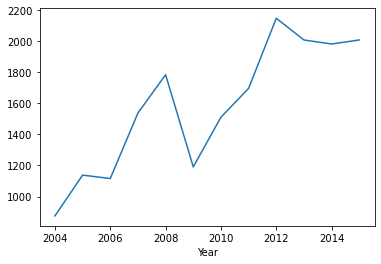

In [5]:
jobs.groupby('Year')['jobpost'].count().plot()
plt.show()

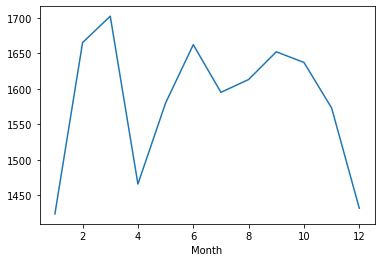

In [6]:
jobs.groupby('Month')['jobpost'].count().plot()
plt.show()

## Trending jobs in Armenia

In [7]:
jobs.Title.value_counts()[:10]

Accountant                  328
Chief Accountant            219
Medical Representative      216
Sales Manager               166
Administrative Assistant    155
Lawyer                      151
Software Developer          134
Project Manager             117
English Language Courses    109
Web Developer               101
Name: Title, dtype: int64

In [8]:
job_title=''
for i in jobs.Title:
    job_title=job_title+str(i)+' '

In [9]:
job_title

'Chief Financial Officer Full-time Community Connections Intern (paid internship) Country Coordinator BCC Specialist Software Developer Saleswoman Chief Accountant/ Finance Assistant Non-paid part or full time Programmatic Intern Assistant to Managing Director Program Assistant (INL), FSN-8; FP-6* Short-Term Travel Grants (STG) Program Non-paid part or full time Administrative Intern Chief of Party (COP) Community Development, Capacity Building and Conflict General Manager Network Administrator Utopian World Championship 2004 Country Economist (NOB) Driver/ Logistics Assistant Graphic Designer Administrative Assistant Lawyer Marketing Advisor Chief/ Supervisor of Programs Department Journalism Trainer Deputy Program Director Student Forum: Student Conference and Debate Forum (April 17 - Reporting Diversity Workshop for Journalists Reporting Diversity Workshop for Journalists Chief Accountant Consultant (short-term) Guard, FSN-2; FP-CC* Training Officer Chauffeur, FSN-3; FP-BB* Demograp

In [10]:
wc_title=WordCloud(max_font_size=80, max_words=100,background_color="white",).generate(job_title)

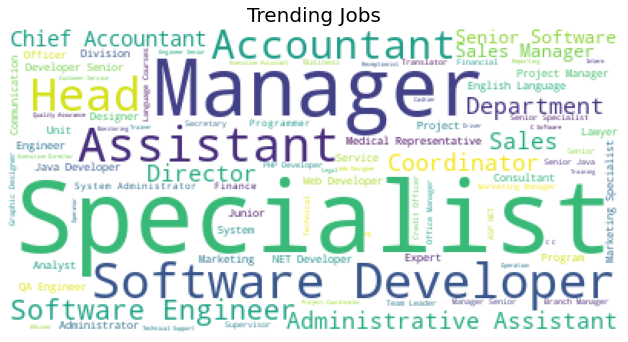

In [11]:
plt.figure(figsize=(11,9))
plt.imshow(wc_title)
plt.title('Trending Jobs',fontsize=20)
plt.axis("off")
plt.show()

## Trending Skills

In [12]:
jobs.RequiredQual.value_counts()[:4]

- Excellent communication skills;\n- Good oral and written communication skills in Armenian and English\nlanguages, knowledge of Russian language is a plus;\n- Basic computer and internet/ e-mail skills;\n- Punctual, communicative, open-minded, self-confident, eager to learn &\nflexible;\n- Ability to complete the tasks in a timely manner.                                                                                  43
The ideal candidate should possess the following:\n- University degree in Accounting, Finance or other related fields;\n- Knowledge of Armenian Accounting Standards and Tax Legislation is\ndesirable;\n- Basic computer and internet/ e-mail skills;\n- Excellent communication skills;\n- Punctual, communicative, open-minded, self-confident, eager to learn &\nflexible;\n- Ability to complete the tasks in a timely manner.    17
The ideal candidate should possess the\nfollowing:\n- University degree in Accounting, Finance or other related fields;\n- Good knowledge of Armenia

In [13]:
req_qual=''
for i in jobs.RequiredQual:
    req_qual=req_qual+str(i)+' '

In [14]:
req_qual=re.sub('[^a-zA-Z ]','',req_qual)
req_qual=re.sub('\n','',req_qual)
req_qual=re.sub('Ability','',req_qual)
req_qual=re.sub('Knowledge','',req_qual)
req_qual=req_qual.strip()
req_qual.lower()

'to perform this job successfully anindividual must be able to perform each essential duty satisfactorilythe requirements listed below are representative of the knowledgeskill andor ability required of generally accepted accounting principles local accounting standards and legislation state reporting requirements pertaining to accounting principles and practices of financial management and budgeting principles and practices of financial systems design and analysis principles and practices of contract management records managementand risk management principles and practices of management and supervision principles and practices of information systems management to apply sound fiscal and administrative practices to the companysactivities plan organize and supervise the work of subordinate employeesincluding training them assigning and evaluating their work andproviding job performance feedback critically analyze fiscal and administrative policies practicesprocedures and systems and recom

In [15]:
wc_req_qual=WordCloud(max_font_size=80, max_words=100,background_color="white",).generate(req_qual)

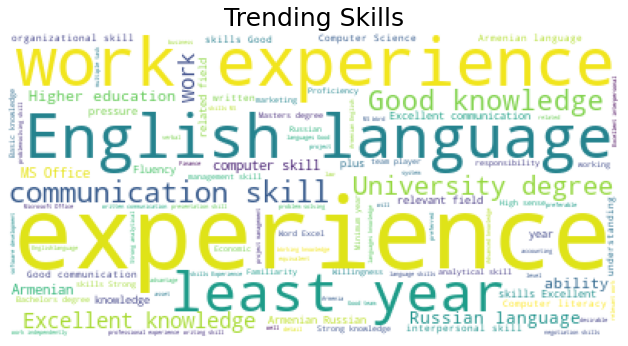

In [16]:
plt.figure(figsize=(11,9))
plt.imshow(wc_req_qual)
plt.title('Trending Skills',fontsize=25)
plt.axis("off")
plt.show()

## Classification Model to Predict if the job is of IT or not

In [17]:
jobs.JobDescription.head()

0    AMERIA Investment Consulting Company is seekin...
1                                                  NaN
2    Public outreach and strengthening of a growing...
3    The LEAD (Local Enhancement and Development fo...
4                                                  NaN
Name: JobDescription, dtype: object

In [18]:
jobs.JobDescription.isna().sum()

3892

In [19]:
jobs.Company.head()

0               AMERIA Investment Consulting Company
1    International Research & Exchanges Board (IREX)
2          Caucasus Environmental NGO Network (CENN)
3                                       Manoff Group
4                             Yerevan Brandy Company
Name: Company, dtype: object

In [20]:
jobs.Company.isna().sum()

7

In [21]:
it_classifier_df=pd.concat([jobs.JobDescription,jobs.Company,jobs.IT],axis=1)

In [22]:
it_classifier_df

,JobDescription,Company,IT
0,AMERIA Investment Consulting Company is seekin...,AMERIA Investment Consulting Company,False
1,NaN,International Research & Exchanges Board (IREX),False
2,Public outreach and strengthening of a growing...,Caucasus Environmental NGO Network (CENN),False
3,The LEAD (Local Enhancement and Development fo...,Manoff Group,False
4,NaN,Yerevan Brandy Company,True
...,...,...,...
18996,A tech startup of Technolinguistics based in N...,Technolinguistics NGO,False
18997,NaN,"""Coca-Cola Hellenic Bottling Company Armenia"" ...",False
18998,NaN,"""Coca-Cola Hellenic Bottling Company Armenia"" ...",False
18999,San Lazzaro LLC is looking for a well-experien...,San Lazzaro LLC,False


In [23]:
it_classifier_df['IT']=np.where(it_classifier_df['IT']==True,1,0)

In [24]:
it_classifier_df.isna().sum()

JobDescription    3892
Company              7
IT                   0
dtype: int64

In [25]:
it_classifier_df.dropna(how='any',inplace=True)

In [26]:
it_classifier_df

,JobDescription,Company,IT
0,AMERIA Investment Consulting Company is seekin...,AMERIA Investment Consulting Company,0
2,Public outreach and strengthening of a growing...,Caucasus Environmental NGO Network (CENN),0
3,The LEAD (Local Enhancement and Development fo...,Manoff Group,0
5,Saleswoman will sell menswear and accessories.,"Boutique ""Appollo""",0
6,The Armenian Branch Office of the Open Society...,OSI Assistance Foundation - Armenian Branch Of...,0
...,...,...,...
18992,The incumbent will develop software applicatio...,Macadamian AR CJSC,1
18995,The incumbent will be responsible for supporti...,"""Transport PIU"" State Institution of the RA Mi...",0
18996,A tech startup of Technolinguistics based in N...,Technolinguistics NGO,0
18999,San Lazzaro LLC is looking for a well-experien...,San Lazzaro LLC,0


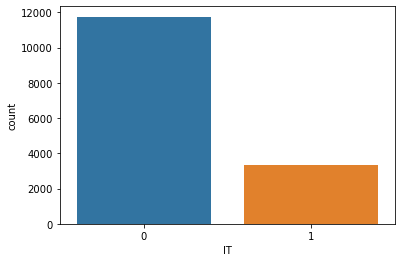

In [27]:
sns.countplot('IT',data=it_classifier_df)
plt.show()

In [28]:
it_classifier_df.isna().sum()

JobDescription    0
Company           0
IT                0
dtype: int64

In [29]:
it_classifier_df['JD_company']=it_classifier_df['JobDescription']+it_classifier_df['Company']

In [30]:
it_classifier_df.JD_company[0]

"AMERIA Investment Consulting Company is seeking a\nChief Financial Officer. This position manages the company's fiscal and\nadministrative functions, provides highly responsible and technically\ncomplex staff assistance to the Executive Director. The work performed\nrequires a high level of technical proficiency in financial management\nand investment management, as well as management, supervisory, and\nadministrative skills.AMERIA Investment Consulting Company"

In [31]:
it_classifier_df.reset_index(drop=True,inplace=True)
it_classifier_df.drop(columns=['JobDescription','Company'],inplace=True)

In [32]:
it_classifier_df

,IT,JD_company
0,0,AMERIA Investment Consulting Company is seekin...
1,0,Public outreach and strengthening of a growing...
2,0,The LEAD (Local Enhancement and Development fo...
3,0,Saleswoman will sell menswear and accessories....
4,0,The Armenian Branch Office of the Open Society...
...,...,...
15104,1,The incumbent will develop software applicatio...
15105,0,The incumbent will be responsible for supporti...
15106,0,A tech startup of Technolinguistics based in N...
15107,0,San Lazzaro LLC is looking for a well-experien...


### Text Cleaning

In [33]:
# Removing unwanted symbols and numbers from the reviews and performing case standardization
def remove_punctutions(x):
    x=re.sub('[^a-zA-Z ]','',x)
    x=re.sub('[0-9]',"",x)
    x=x.strip()
    return x.lower()

In [34]:
it_classifier_df['JD_company_cleaned']=it_classifier_df['JD_company'].apply(lambda x: remove_punctutions(x))

In [35]:
it_classifier_df['JD_company_cleaned'][0]

'ameria investment consulting company is seeking achief financial officer this position manages the companys fiscal andadministrative functions provides highly responsible and technicallycomplex staff assistance to the executive director the work performedrequires a high level of technical proficiency in financial managementand investment management as well as management supervisory andadministrative skillsameria investment consulting company'

### Tokenization

In [36]:
def token(word):
    return word.split(' ')

In [37]:
it_classifier_df['JD_company_cleaned_token']=it_classifier_df['JD_company_cleaned'].apply(lambda x : token(x))

In [38]:
it_classifier_df['JD_company_cleaned_token'][0]

['ameria',
 'investment',
 'consulting',
 'company',
 'is',
 'seeking',
 'achief',
 'financial',
 'officer',
 'this',
 'position',
 'manages',
 'the',
 'companys',
 'fiscal',
 'andadministrative',
 'functions',
 'provides',
 'highly',
 'responsible',
 'and',
 'technicallycomplex',
 'staff',
 'assistance',
 'to',
 'the',
 'executive',
 'director',
 'the',
 'work',
 'performedrequires',
 'a',
 'high',
 'level',
 'of',
 'technical',
 'proficiency',
 'in',
 'financial',
 'managementand',
 'investment',
 'management',
 'as',
 'well',
 'as',
 'management',
 'supervisory',
 'andadministrative',
 'skillsameria',
 'investment',
 'consulting',
 'company']

### Typo Corrections

In [39]:
# def typo(text):
#     typo_list=[]
#     for word in text:
#         tb=TextBlob(word)
#         typo_list.append(tb.correct().raw)
#     return typo_list

In [40]:
# it_classifier_df['JD_company_cleaned_token_typo']=it_classifier_df['JD_company_cleaned_token'].apply(lambda x : typo(x))

In [41]:
#Skipped because it was taking too much time for processing.

### Removing Stopwords

In [42]:
list_stopwords=stopwords.words('english')

In [43]:
len(list_stopwords)

179

In [44]:
def rem_stopwords(x):
    for i in x:
        if i in list_stopwords:
            x.remove(i)
    return x

In [45]:
it_classifier_df['JD_company_cleaned_token_stopwords']=it_classifier_df['JD_company_cleaned_token'].apply(lambda x : rem_stopwords(x))

In [46]:
it_classifier_df['JD_company_cleaned_token_stopwords'][0]

['ameria',
 'investment',
 'consulting',
 'company',
 'seeking',
 'achief',
 'financial',
 'officer',
 'position',
 'manages',
 'companys',
 'fiscal',
 'andadministrative',
 'functions',
 'provides',
 'highly',
 'responsible',
 'technicallycomplex',
 'staff',
 'assistance',
 'executive',
 'director',
 'the',
 'work',
 'performedrequires',
 'high',
 'level',
 'technical',
 'proficiency',
 'financial',
 'managementand',
 'investment',
 'management',
 'well',
 'management',
 'supervisory',
 'andadministrative',
 'skillsameria',
 'investment',
 'consulting',
 'company']

### Stemming and Lemmatization

#### Stemming

In [47]:
ps=nltk.stem.PorterStemmer()

In [48]:
ps=nltk.stem.PorterStemmer()
ps=nltk.stem.PorterStemmer()
def stem(text):
    temp_stem=[]
    for word in text:
        temp_stem.append(ps.stem(word))
    return temp_stem

In [49]:
it_classifier_df['JD_company_cleaned_token_stopwords_stem']=it_classifier_df['JD_company_cleaned_token_stopwords'].apply(lambda x : stem(x))

In [50]:
it_classifier_df.head()

,IT,JD_company,JD_company_cleaned,JD_company_cleaned_token,JD_company_cleaned_token_stopwords,JD_company_cleaned_token_stopwords_stem
0,0,AMERIA Investment Consulting Company is seekin...,ameria investment consulting company is seekin...,"[ameria, investment, consulting, company, seek...","[ameria, investment, consulting, company, seek...","[ameria, invest, consult, compani, seek, achie..."
1,0,Public outreach and strengthening of a growing...,public outreach and strengthening of a growing...,"[public, outreach, strengthening, growingnetwo...","[public, outreach, strengthening, growingnetwo...","[public, outreach, strengthen, growingnetwork,..."
2,0,The LEAD (Local Enhancement and Development fo...,the lead local enhancement and development for...,"[lead, local, enhancement, development, forhea...","[lead, local, enhancement, development, forhea...","[lead, local, enhanc, develop, forhealth, bcc,..."
3,0,Saleswoman will sell menswear and accessories....,saleswoman will sell menswear and accessoriesb...,"[saleswoman, sell, menswear, accessoriesboutiq...","[saleswoman, sell, menswear, accessoriesboutiq...","[saleswoman, sell, menswear, accessoriesboutiq..."
4,0,The Armenian Branch Office of the Open Society...,the armenian branch office of the open society...,"[armenian, branch, office, open, societyinstit...","[armenian, branch, office, open, societyinstit...","[armenian, branch, offic, open, societyinstitu..."


#### Lemmatization

In [51]:
wn=nltk.wordnet.WordNetLemmatizer()

In [52]:
def lemma(text):
    temp_lemma=[]
    for word in text:
        temp_lemma.append(wn.lemmatize(word))
    return temp_lemma

In [53]:
it_classifier_df['JD_company_cleaned_token_stopwords_stem_lemma']=it_classifier_df['JD_company_cleaned_token_stopwords_stem'].apply(lambda x : lemma(x))

In [54]:
it_classifier_df.head()

,IT,JD_company,JD_company_cleaned,JD_company_cleaned_token,JD_company_cleaned_token_stopwords,JD_company_cleaned_token_stopwords_stem,JD_company_cleaned_token_stopwords_stem_lemma
0,0,AMERIA Investment Consulting Company is seekin...,ameria investment consulting company is seekin...,"[ameria, investment, consulting, company, seek...","[ameria, investment, consulting, company, seek...","[ameria, invest, consult, compani, seek, achie...","[ameria, invest, consult, compani, seek, achie..."
1,0,Public outreach and strengthening of a growing...,public outreach and strengthening of a growing...,"[public, outreach, strengthening, growingnetwo...","[public, outreach, strengthening, growingnetwo...","[public, outreach, strengthen, growingnetwork,...","[public, outreach, strengthen, growingnetwork,..."
2,0,The LEAD (Local Enhancement and Development fo...,the lead local enhancement and development for...,"[lead, local, enhancement, development, forhea...","[lead, local, enhancement, development, forhea...","[lead, local, enhanc, develop, forhealth, bcc,...","[lead, local, enhanc, develop, forhealth, bcc,..."
3,0,Saleswoman will sell menswear and accessories....,saleswoman will sell menswear and accessoriesb...,"[saleswoman, sell, menswear, accessoriesboutiq...","[saleswoman, sell, menswear, accessoriesboutiq...","[saleswoman, sell, menswear, accessoriesboutiq...","[saleswoman, sell, menswear, accessoriesboutiq..."
4,0,The Armenian Branch Office of the Open Society...,the armenian branch office of the open society...,"[armenian, branch, office, open, societyinstit...","[armenian, branch, office, open, societyinstit...","[armenian, branch, offic, open, societyinstitu...","[armenian, branch, offic, open, societyinstitu..."


### Final Cleaned Data

In [55]:
def cleaned(text):
    return ' '.join(text)

In [56]:
it_classifier_df['JD_company_cleaned_final']=it_classifier_df['JD_company_cleaned_token_stopwords_stem_lemma'].apply(lambda x : cleaned(x))

In [57]:
it_classifier_df['JD_company_cleaned_final'].head()

0    ameria invest consult compani seek achief fina...
1    public outreach strengthen growingnetwork envi...
2    lead local enhanc develop forhealth bcc specia...
3    saleswoman sell menswear accessoriesboutiqu ap...
4    armenian branch offic open societyinstitut ass...
Name: JD_company_cleaned_final, dtype: object

# Creating TF-IDF Vectorizer

In [58]:
tfidf=TfidfVectorizer(stop_words='english',ngram_range=(1,1))

In [59]:
tfidf=tfidf.fit(it_classifier_df['JD_company_cleaned_final'])

In [60]:
tfidf_mat=tfidf.transform(it_classifier_df['JD_company_cleaned_final'])

In [61]:
tfidf_final=pd.DataFrame(tfidf_mat.todense(),columns=tfidf.get_feature_names())

In [62]:
tfidf_final.head()

,aa,aaa,aaasf,aaasfarmenian,aac,aadministr,aaff,aafpc,aalaverdyanfor,aalyst,...,zoneworld,zoom,zte,zugdidi,zusammenarbeit,zvartnot,zvartnotsairport,zvartnotsbranch,zvartnotsintern,zx
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [63]:
Y=it_classifier_df['IT'].copy()

In [64]:
Y.value_counts()

0    11751
1     3358
Name: IT, dtype: int64

## Train Test Split

In [ ]:
X_train,X_test,Y_train,Y_test=train_test_split(tfidf_final,Y,test_size=0.3,random_state=101)

In [ ]:
print(X_train.shape)
print(Y_train.shape)
print(X_test.shape)
print(Y_test.shape)

(10576, 37020)
(10576,)
(4533, 37020)
(4533,)


# Model Building

## Naive Bayes

In [ ]:
nb=BernoulliNB()

In [68]:
nb=nb.fit(X_train,Y_train)

### Train Performance Metrics

In [69]:
print('Accuracy Score of Train for Naive Bayes  : ',accuracy_score(Y_train,nb.predict(X_train)))
print('\n')
print('Confusion Matrix of Train for Naive Bayes : \n',confusion_matrix(Y_train,nb.predict(X_train)))
print('\n')
print('Classification Report of Train for Naive Bayes : \n',classification_report(Y_train,nb.predict(X_train)))

Accuracy Score of Train for Naive Bayes  :  0.925302571860817


Confusion Matrix of Train for Naive Bayes : 
 [[8095  160]
 [ 630 1691]]


Classification Report of Train for Naive Bayes : 
               precision    recall  f1-score   support

           0       0.93      0.98      0.95      8255
           1       0.91      0.73      0.81      2321

    accuracy                           0.93     10576
   macro avg       0.92      0.85      0.88     10576
weighted avg       0.92      0.93      0.92     10576



### Test Performance Metrics

In [70]:
print('Accuracy Score of Test for Naive Bayes  : ',accuracy_score(Y_test,nb.predict(X_test)))
print('\n')
print('Confusion Matrix of Test for Naive Bayes : \n',confusion_matrix(Y_test,nb.predict(X_test)))
print('\n')
print('Classification Report of Test for Naive Bayes : \n',classification_report(Y_test,nb.predict(X_test)))

Accuracy Score of Test for Naive Bayes  :  0.9031546437238033


Confusion Matrix of Test for Naive Bayes : 
 [[3379  117]
 [ 322  715]]


Classification Report of Test for Naive Bayes : 
               precision    recall  f1-score   support

           0       0.91      0.97      0.94      3496
           1       0.86      0.69      0.77      1037

    accuracy                           0.90      4533
   macro avg       0.89      0.83      0.85      4533
weighted avg       0.90      0.90      0.90      4533



## Random Forest Classifier

In [71]:
rf=RandomForestClassifier()

In [72]:
rf=rf.fit(X_train,Y_train)

### Train Performance Metrics

In [73]:
print('Accuracy Score of Train for Random Forest Classifier : ',accuracy_score(Y_train,rf.predict(X_train)))
print('\n')
print('Confusion Matrix of Train for Random Forest Classifier : \n',confusion_matrix(Y_train,rf.predict(X_train)))
print('\n')
print('Classification Report of Train for Random Forest Classifier : \n',classification_report(Y_train,rf.predict(X_train)))

Accuracy Score of Train for Random Forest Classifier :  0.9995272314674736


Confusion Matrix of Train for Random Forest Classifier : 
 [[8252    3]
 [   2 2319]]


Classification Report of Train for Random Forest Classifier : 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      8255
           1       1.00      1.00      1.00      2321

    accuracy                           1.00     10576
   macro avg       1.00      1.00      1.00     10576
weighted avg       1.00      1.00      1.00     10576



### Test Performance Metrics

In [74]:
print('Accuracy Score of Test for Random Forest Classifier  : ',accuracy_score(Y_test,rf.predict(X_test)))
print('\n')
print('Confusion Matrix of Test for Random Forest Classifier : \n',confusion_matrix(Y_test,rf.predict(X_test)))
print('\n')
print('Classification Report of Test for Random Forest Classifier : \n',classification_report(Y_test,rf.predict(X_test)))

Accuracy Score of Test for Random Forest Classifier  :  0.9302889918376351


Confusion Matrix of Test for Random Forest Classifier : 
 [[3437   59]
 [ 257  780]]


Classification Report of Test for Random Forest Classifier : 
               precision    recall  f1-score   support

           0       0.93      0.98      0.96      3496
           1       0.93      0.75      0.83      1037

    accuracy                           0.93      4533
   macro avg       0.93      0.87      0.89      4533
weighted avg       0.93      0.93      0.93      4533



## ANN Classifier

In [75]:
mlp=MLPClassifier()

In [76]:
mlp=mlp.fit(X_train,Y_train)

### Train Performance Metrics

In [77]:
print('Accuracy Score of Train for ANN Classifier : ',accuracy_score(Y_train,mlp.predict(X_train)))
print('\n')
print('Confusion Matrix of Train for ANN Classifier : \n',confusion_matrix(Y_train,mlp.predict(X_train)))
print('\n')
print('Classification Report of Train for ANN Classifier : \n',classification_report(Y_train,mlp.predict(X_train)))

Accuracy Score of Train for ANN Classifier :  0.999338124054463


Confusion Matrix of Train for ANN Classifier : 
 [[8251    4]
 [   3 2318]]


Classification Report of Train for ANN Classifier : 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00      8255
           1       1.00      1.00      1.00      2321

    accuracy                           1.00     10576
   macro avg       1.00      1.00      1.00     10576
weighted avg       1.00      1.00      1.00     10576



### Train Performance Metrics

In [78]:
print('Accuracy Score of Test for ANN Classifier  : ',accuracy_score(Y_test,mlp.predict(X_test)))
print('\n')
print('Confusion Matrix of Test for ANN Classifier : \n',confusion_matrix(Y_test,mlp.predict(X_test)))
print('\n')
print('Classification Report of Test for ANN Classifier : \n',classification_report(Y_test,mlp.predict(X_test)))

Accuracy Score of Test for ANN Classifier  :  0.9344804765056254


Confusion Matrix of Test for ANN Classifier : 
 [[3365  131]
 [ 166  871]]


Classification Report of Test for ANN Classifier : 
               precision    recall  f1-score   support

           0       0.95      0.96      0.96      3496
           1       0.87      0.84      0.85      1037

    accuracy                           0.93      4533
   macro avg       0.91      0.90      0.91      4533
weighted avg       0.93      0.93      0.93      4533



### Inference
### WE GOT BEST TRAINING AND TESTING ACCURACY FROM ANN

# Similarity of Jobs

In [79]:
jobs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19001 entries, 0 to 19000
Data columns (total 24 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   jobpost           19001 non-null  object
 1   date              19001 non-null  object
 2   Title             18973 non-null  object
 3   Company           18994 non-null  object
 4   AnnouncementCode  1208 non-null   object
 5   Term              7676 non-null   object
 6   Eligibility       4930 non-null   object
 7   Audience          640 non-null    object
 8   StartDate         9675 non-null   object
 9   Duration          10798 non-null  object
 10  Location          18969 non-null  object
 11  JobDescription    15109 non-null  object
 12  JobRequirment     16479 non-null  object
 13  RequiredQual      18517 non-null  object
 14  Salary            9622 non-null   object
 15  ApplicationP      18941 non-null  object
 16  OpeningDate       18295 non-null  object
 17  Deadline    

In [80]:
similarity_df=jobs[['Title']]

In [81]:
similarity_df.head()

,Title
0,Chief Financial Officer
1,Full-time Community Connections Intern (paid i...
2,Country Coordinator
3,BCC Specialist
4,Software Developer


## Data Cleaning

### Removing Punctuations and Case Standardization

In [82]:
similarity_df['Title_rem_punch']=similarity_df['Title'].apply(lambda x: remove_punctutions(str(x)))

In [83]:
similarity_df.head()

,Title,Title_rem_punch
0,Chief Financial Officer,chief financial officer
1,Full-time Community Connections Intern (paid i...,fulltime community connections intern paid int...
2,Country Coordinator,country coordinator
3,BCC Specialist,bcc specialist
4,Software Developer,software developer


### Tokenization

In [84]:
similarity_df['Title_token']=similarity_df['Title_rem_punch'].apply(lambda x : token(x))

In [85]:
similarity_df.head()

,Title,Title_rem_punch,Title_token
0,Chief Financial Officer,chief financial officer,"[chief, financial, officer]"
1,Full-time Community Connections Intern (paid i...,fulltime community connections intern paid int...,"[fulltime, community, connections, intern, pai..."
2,Country Coordinator,country coordinator,"[country, coordinator]"
3,BCC Specialist,bcc specialist,"[bcc, specialist]"
4,Software Developer,software developer,"[software, developer]"


### Removing Stopwords

In [86]:
similarity_df['Title_rem_stopwords']=similarity_df['Title_token'].apply(lambda x : rem_stopwords(x))

In [87]:
similarity_df.head()

,Title,Title_rem_punch,Title_token,Title_rem_stopwords
0,Chief Financial Officer,chief financial officer,"[chief, financial, officer]","[chief, financial, officer]"
1,Full-time Community Connections Intern (paid i...,fulltime community connections intern paid int...,"[fulltime, community, connections, intern, pai...","[fulltime, community, connections, intern, pai..."
2,Country Coordinator,country coordinator,"[country, coordinator]","[country, coordinator]"
3,BCC Specialist,bcc specialist,"[bcc, specialist]","[bcc, specialist]"
4,Software Developer,software developer,"[software, developer]","[software, developer]"


### Final Clean Data

In [88]:
similarity_df['Title_final']=similarity_df['Title_rem_stopwords'].apply(lambda x : cleaned(x))

In [89]:
similarity_df['Title_final'].head()

0                              chief financial officer
1    fulltime community connections intern paid int...
2                                  country coordinator
3                                       bcc specialist
4                                   software developer
Name: Title_final, dtype: object

## Creating DTM

In [90]:
cnt=CountVectorizer(stop_words='english',ngram_range=(1,1))

In [91]:
cnt=cnt.fit(similarity_df['Title_final'])

In [92]:
dtm=cnt.transform(similarity_df['Title_final'])

In [93]:
dtm=dtm.todense()

In [94]:
dtm_final=pd.DataFrame(dtm,columns=cnt.get_feature_names())

In [95]:
dtm_final.head()

,aacas,abap,abatement,abattoir,abkhazia,abovyan,abuse,ac,academy,acca,...,yoga,young,youth,zang,zend,zonal,zone,zones,zooplankton,zvartnots
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## Finding Best Value of K

### Elbow Method

In [96]:
cluster_error=[]
for cluster in [3,4,5,6,7,8,9]:
    km=KMeans(n_clusters=cluster)
    km=km.fit(dtm_final)
    cluster_error.append(km.inertia_) 

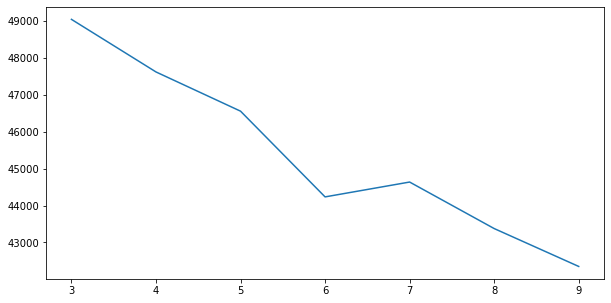

In [97]:
plt.figure(figsize=(10,5))
sns.lineplot(x=np.array(range(3,10)),y=np.array(cluster_error))
plt.show()

### SC Score Method

In [98]:
sc_score=[]
for i in [3,4,5,6,7,8,9]:
    km=KMeans(n_clusters=i)
    km=km.fit(dtm_final)
    sc_score.append(silhouette_score(dtm_final,km.labels_))

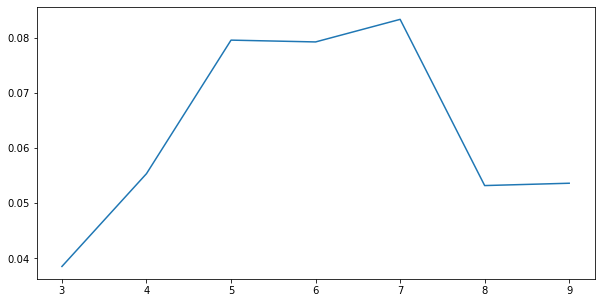

In [99]:
plt.figure(figsize=(10,5))
sns.lineplot(x=np.array(range(3,10)),y=np.array(sc_score))
plt.show()

## From the above two test, we can conclude that 6 is the best value of K for our given data

In [100]:
kmeans=KMeans(n_clusters=6)

In [101]:
kmeans=kmeans.fit(dtm_final)

In [102]:
pd.DataFrame(kmeans.cluster_centers_,columns=dtm_final.columns).T

,0,1,2,3,4,5
aacas,9.990010e-05,-2.371692e-19,-2.507218e-19,-2.507218e-19,-1.761829e-19,-2.303930e-19
abap,-2.913793e-19,5.265929e-04,-2.507218e-19,-2.507218e-19,-1.761829e-19,-2.303930e-19
abatement,9.990010e-05,-2.371692e-19,-2.507218e-19,-2.507218e-19,-1.761829e-19,-2.303930e-19
abattoir,9.990010e-05,-2.371692e-19,-2.507218e-19,-2.507218e-19,-1.761829e-19,-2.303930e-19
abkhazia,9.990010e-05,-2.371692e-19,-2.507218e-19,-2.507218e-19,-1.761829e-19,-2.303930e-19
...,...,...,...,...,...,...
zonal,9.990010e-05,-2.371692e-19,-2.507218e-19,-2.507218e-19,-1.761829e-19,-2.303930e-19
zone,1.998002e-04,-4.743385e-19,-5.014435e-19,-5.014435e-19,-3.523657e-19,-4.607859e-19
zones,9.990010e-05,-2.371692e-19,-2.507218e-19,-2.507218e-19,-1.761829e-19,-2.303930e-19
zooplankton,-2.913793e-19,-2.371692e-19,-2.507218e-19,4.948046e-04,-1.761829e-19,-2.303930e-19


In [103]:
terms=pd.Series(dtm_final.columns)

In [104]:
terms.head()

0        aacas
1         abap
2    abatement
3     abattoir
4     abkhazia
dtype: object

In [105]:
for i in range(0,6):
    topic_words=(kmeans.cluster_centers_)[i].argsort()[:30]
    words=terms.iloc[topic_words.tolist()].values
    print("Topic "+str(i+1)+' words are : ',','.join(words))
    print('\n')

Topic 1 words are :  specialist,accountant,deep,submicron,cnet,radio,ad,gui,ip,lycos,bsp,telecommunication,scm,tender,users,release,sw,carrier,eda,ya,presales,deals,vb,housing,loancredit,grails,coo,games,main,smm


Topic 2 words are :  assistant,executive,financial,officer,expert,coordinator,credit,finance,english,head,administrative,lawyer,deputy,internal,retail,corporate,administration,translator,brand,lending,operator,division,deep,teller,submicron,writer,regional,associate,secretary,controller


Topic 3 words are :  programmer,android,aspnet,clerk,ios,operator,interpreter,trainer,developers,lead,writer,teller,teacher,technician,cashier,governance,sql,flash,rights,backend,desk,protection,trainee,law,preservice,workshop,chemist,ii,medium,pharmacist


Topic 4 words are :  net,deputy,intern,android,aspnet,brand,translator,secretary,writer,teller,ios,controller,rd,regional,cashier,teacher,merchandiser,shop,country,backend,marz,flash,embedded,tester,trainee,sponsorship,nan,educational,ms

## =====================HAPPY LEARNING====================